In [11]:
!pip install pandas matplotlib numpy
!python3 -m pip install --upgrade pip
!pip install pandas matplotlib plotly


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


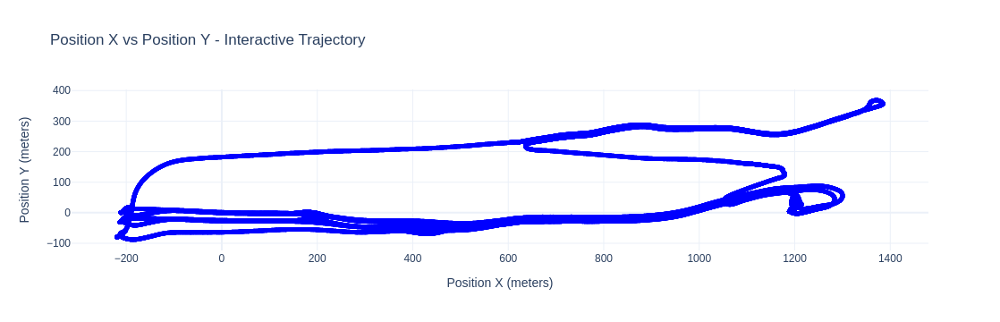

In [18]:
# Install necessary dependencies

# Import libraries
import pandas as pd
import plotly.graph_objs as go
import plotly.offline as pyo

# Load the CSV data
csv_file_path = 'odom_data.csv'  # Update this path if needed
df = pd.read_csv(csv_file_path)

# Convert necessary columns to NumPy arrays
position_x = df['position_x'].to_numpy()
position_y = df['position_y'].to_numpy()

# Create the plot using Plotly
trace = go.Scatter(
    x=position_x,
    y=position_y,
    mode='lines+markers',
    marker=dict(size=5, color='blue'),
    line=dict(width=2)
)

layout = go.Layout(
    title='Position X vs Position Y - Interactive Trajectory',
    xaxis=dict(title='Position X (meters)'),
    yaxis=dict(title='Position Y (meters)'),
    template='plotly_white'
)

fig = go.Figure(data=[trace], layout=layout)

# Show the interactive plot
pyo.init_notebook_mode(connected=True)
pyo.iplot(fig)


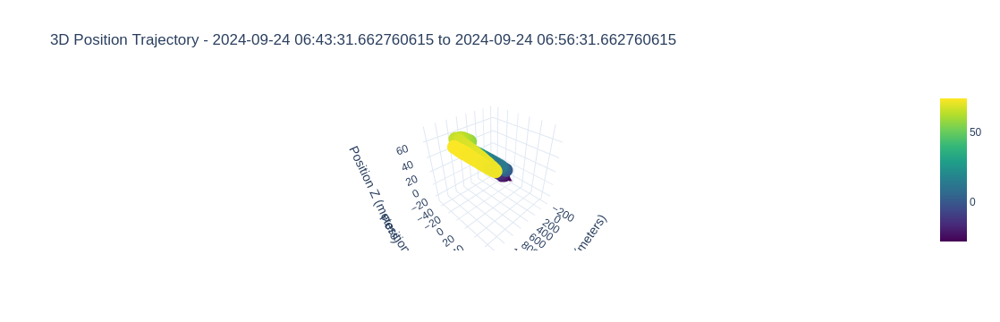

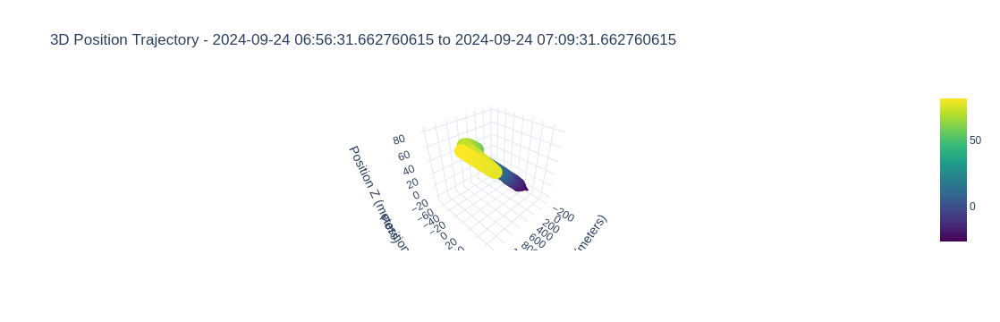

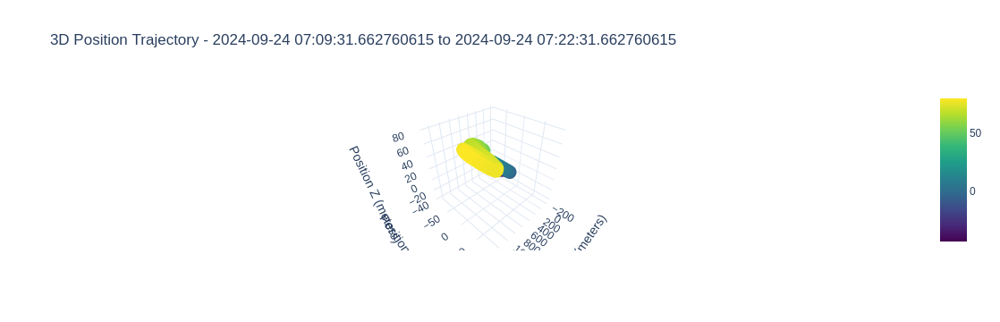

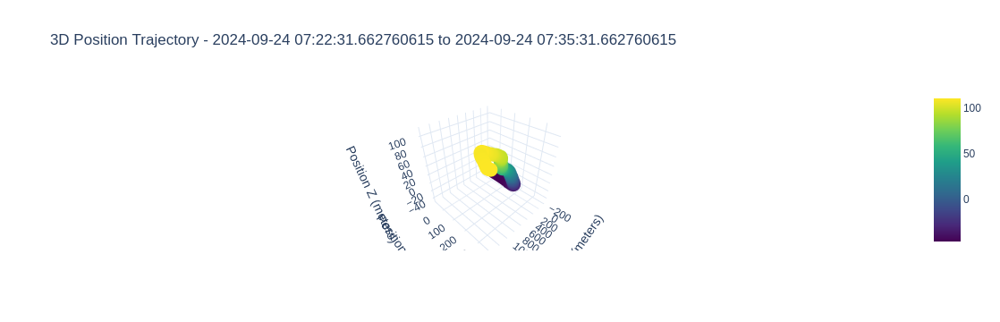

In [32]:
import pandas as pd
import plotly.graph_objs as go
import plotly.offline as pyo
from datetime import datetime, timedelta

# Load the CSV data
csv_file_path = 'odom_data.csv'
df = pd.read_csv(csv_file_path)

# Combine `timestamp_sec` and `timestamp_nanosec` into a single datetime column
df['timestamp'] = pd.to_datetime(df['timestamp_sec'], unit='s') + pd.to_timedelta(df['timestamp_nanosec'], unit='ns')

# Define 20-minute chunks
start_time = df['timestamp'].min()
end_time = df['timestamp'].max()
time_chunks = pd.date_range(start=start_time, end=end_time, freq='13T')

# Iterate through each time chunk and create 3D zoomable plots
for i in range(len(time_chunks) - 1):
    chunk_start = time_chunks[i]
    chunk_end = time_chunks[i + 1]
    
    # Filter data for the current chunk
    chunk_df = df[(df['timestamp'] >= chunk_start) & (df['timestamp'] < chunk_end)]
    
    # Check if the chunk has data
    if chunk_df.empty:
        continue
    
    # Extract `position_x`, `position_y`, and `position_z` for plotting
    position_x = chunk_df['position_x'].to_numpy()
    position_y = chunk_df['position_y'].to_numpy()
    position_z = chunk_df['position_z'].to_numpy()
    
    # Create the 3D plot using Plotly
    trace = go.Scatter3d(
        x=position_x,
        y=position_y,
        z=position_z,
        mode='lines+markers',
        marker=dict(size=5, color=position_z, colorscale='Viridis', showscale=True),
        line=dict(width=2)
    )
    
    layout = go.Layout(
        title=f'3D Position Trajectory - {chunk_start} to {chunk_end}',
        scene=dict(
            xaxis=dict(title='Position X (meters)'),
            yaxis=dict(title='Position Y (meters)'),
            zaxis=dict(title='Position Z (meters)'),
        ),
        template='plotly_white',
    )
    
    fig = go.Figure(data=[trace], layout=layout)
    
    # Show the interactive 3D plot
    pyo.init_notebook_mode(connected=True)
    pyo.iplot(fig)


In [20]:
file_path = '/home/rickeshtn/Projects/berlin_company_data/ros_data1/pointcloud_index.txt'

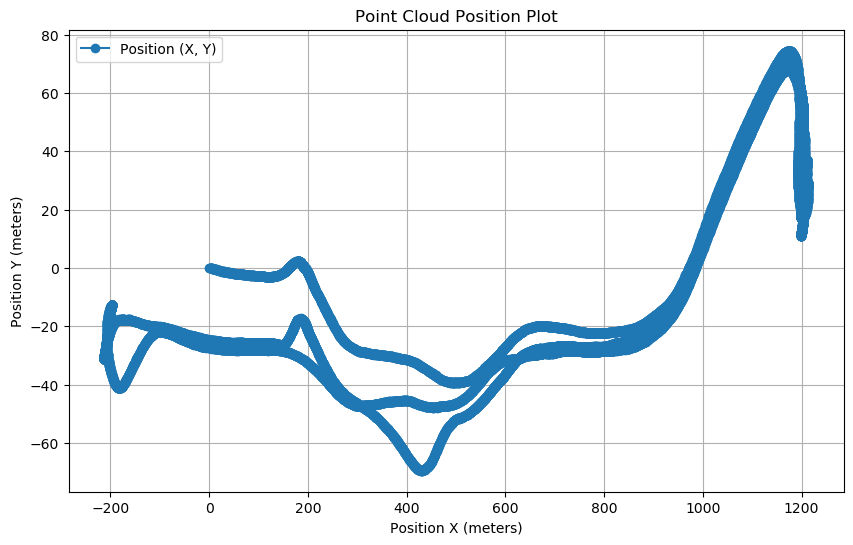

In [17]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Load the text file and parse the data

# Initialize lists to hold data
position_x = []
position_y = []
position_z = []
orientation_x = []
orientation_y = []
orientation_z = []
orientation_w = []

# Read the data from the text file
with open(file_path, 'r') as file:
    for line in file:
        parts = line.strip().split()
        if len(parts) != 2:
            continue
        _, data = parts
        values = data.split(',')
        if len(values) == 7:
            x, y, z, ox, oy, oz, ow = map(float, values)
            position_x.append(x)
            position_y.append(y)
            position_z.append(z)
            orientation_x.append(ox)
            orientation_y.append(oy)
            orientation_z.append(oz)
            orientation_w.append(ow)

# Convert lists to numpy arrays for easier handling
position_x = np.array(position_x)
position_y = np.array(position_y)
position_z = np.array(position_z)
orientation_x = np.array(orientation_x)
orientation_y = np.array(orientation_y)
orientation_z = np.array(orientation_z)
orientation_w = np.array(orientation_w)

# Plot the positions
plt.figure(figsize=(10, 6))
plt.plot(position_x, position_y, linestyle='-', marker='o', label='Position (X, Y)')
plt.xlabel('Position X (meters)')
plt.ylabel('Position Y (meters)')
plt.title('Point Cloud Position Plot')
plt.legend()
plt.grid(True)
plt.show()
